# RealWaste Image Multiclass Classification
* **TASK**: Multclass image classification
* **DATASET**: RealWaste

RealWaste is an image dataset assembled from **waste material** received at the Whyte's Gully Waste and Resource Recovery facility in Wollongong NSW Australia (Single, S.; Iranmanesh, S.; Raad, R. RealWaste: A Novel Real-Life Data Set for Landfill Waste Classification Using Deep Learning. Information 2023, 14, 633. https://doi.org/10.3390/info14120633). 

It is a comprehensive dataset that covers various classes of landfilled waste for sustainable waste management.

The dataset is composed of the following labels and image counts:
  - Cardboard: 461
  - Food Organics: 411
  - Glass: 420
  - Metal: 790
  - Miscellaneous Trash: 495
  - Paper: 500
  - Plastic: 921
  - Textile Trash: 318
  - Vegetation: 436

The dataset was downloaded from the UC Irvine Machine Learning repository (https://archive.ics.uci.edu/).
It contains colored images of waste items captured at the point of reception in a landfill environment. Images are released in 524x524.




## 1. Library and dataset loading

In [142]:
import os
import matplotlib.pyplot as plt
from IPython.display import Image, display
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib.cm as cm
import seaborn as sns
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras import Model, Input
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Activation, BatchNormalization, Conv2D, Dense, Dropout, Flatten, MaxPooling2D, SeparableConv2D, GlobalAveragePooling2D
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.utils.class_weight import compute_class_weight
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import CategoricalCrossentropy
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping
from tensorflow.keras.metrics import CategoricalAccuracy
from keras.applications import InceptionV3, DenseNet121
from sklearn.metrics import classification_report, confusion_matrix
from tabulate import tabulate
import cv2
#!pip install split-folders

In [12]:
# For Reproducibility
tf.keras.utils.set_random_seed(42)
# If using TensorFlow, this will make GPU ops as deterministic as possible,
# but it will affect the overall performance, so be mindful of that.
tf.config.experimental.enable_op_determinism()

Download the dataset from the UC Irvine Machine Learning repository

In [13]:

#! wget https://archive.ics.uci.edu/static/public/908/realwaste.zip
#! unzip realwaste.zip

## 2. Functions

In [14]:
sns.set_style('white')

def GetKeyFromOneHot(d, one_hot_vector):
    for key, val in d.items():
        if np.array_equal(val, one_hot_vector):
            return key
    return None

def PlotClassesDistribution(ax, dataset_dir, title):
    # Dict to store the counts for each class
    class_counts = {'Cardboard': 0, 'Food Organics':0,'Glass':0,'Metal':0,'Miscellaneous Trash':0,'Paper':0,'Plastic':0,'Textile Trash':0,'Vegetation':0 }
    total_images = 0

    for root, dirs, files in os.walk(dataset_dir):
        for subdir in dirs:
            # Dount the n° of files in each subdir
            class_name = subdir
            class_path = os.path.join(root, subdir)
            num_files = len(os.listdir(class_path))
            total_images += num_files
            
            # Put in the dict
            class_counts[class_name] = num_files

    # Calculate also the % per each class
    class_percentages = {}
    for class_name, class_count in class_counts.items():
        perc = (class_count / total_images) * 100
        class_percentages[class_name] = perc

    colormap = plt.colormaps['viridis']
    colors = colormap(np.linspace(0, 1, len(class_counts)))
    # distribution plot
    bars = ax.bar(class_counts.keys(), class_counts.values(),color=colors)
    ax.set_xlabel('Class')
    ax.set_ylabel('Number of Images')
    ax.set_title(title)
    ax.tick_params(axis='x', rotation=90)

    for bar, percentage in zip(bars, class_percentages.values()):
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width() / 2, height, f'{percentage:.1f}%', ha='center', va='bottom')


def PlotHistory(history):
    epochs = range(1, len(history.history["loss"]) + 1)
    loss = history.history["loss"]
    val_loss = history.history["val_loss"]
    train_accuracy = history.history["accuracy"]
    val_accuracy = history.history["val_accuracy"]
    
    has_lr = 'lr' in history.history
    if has_lr:
        learning_rate = history.history['lr']

    fig, ax = plt.subplots(nrows=2, ncols=1, figsize=(16, 10))

    # Acc
    ax[0].set_title('Training/Validation Accuracy plot')
    ax[0].plot(epochs, train_accuracy, '.-', label='Train Accuracy', color='#9AB87A')
    ax[0].plot(epochs, val_accuracy, '.-', label='Validation Accuracy', color='#2B4162')
    ax[0].set_xlabel('Epochs')
    ax[0].set_ylabel('Accuracy')
    ax[0].legend(loc='center left', bbox_to_anchor=(1.1, 0.5))

    if has_lr:
        #  learning rate
        ax2 = ax[0].twinx()
        ax2.plot(epochs, learning_rate, '--', label='Learning Rate', color='grey')
        ax2.set_ylabel('Learning Rate')
        ax2.legend(loc='center left', bbox_to_anchor=(1.1, 0.4))

    # Loss 
    ax[1].set_title('Training/Validation Loss plot')
    ax[1].plot(epochs, loss, '.-', label='Train Loss', color='#9AB87A')
    ax[1].plot(epochs, val_loss, '.-', label='Validation Loss', color='#2B4162')
    ax[1].set_xlabel('Epochs')
    ax[1].set_ylabel('Loss')
    ax[1].legend(loc='center left', bbox_to_anchor=(1.1, 0.5))

    if has_lr:
        # for learning rate
        ax3 = ax[1].twinx()
        ax3.plot(epochs, learning_rate, '--', label='Learning Rate', color='grey')
        ax3.set_ylabel('Learning Rate')
        ax3.legend(loc='center left', bbox_to_anchor=(1.1, 0.4))

    plt.tight_layout(rect=[0, 0, 0.85, 1.1])
    plt.show()


def PlotConfusionMatrix(data, labels, ax):
    # Calculate row-wise sums to normalize the confusion matrix
    row_sums = data.sum(axis=1, keepdims=True)
    # Calculate percentages
    data_percentages = data / row_sums.astype(float) * 100
    
    im = ax.imshow(data_percentages, interpolation='nearest', cmap='GnBu')
    ax.figure.colorbar(im, ax=ax)

    ax.set_xlabel('Predicted Labels')
    ax.set_ylabel('True Labels')
    ax.set_title('Confusion Matrix')

    ax.set_xticks(np.arange(len(labels)))
    ax.set_xticklabels(labels, rotation=45)
    ax.set_yticks(np.arange(len(labels)))
    ax.set_yticklabels(labels, rotation=0)

    # Loop over data dimensions and create text annotations
    for i in range(len(labels)):
        for j in range(len(labels)):
            ax.text(j, i, f"{data[i, j]}\n({data_percentages[i, j]:.1f}%)", ha='center', va='center', color='black')

    ax.grid(which='minor', color='w', linestyle='-', linewidth=3)


def PlotMetricsAndConfusionMatrix(metrics_dict, labels, y_true, y_pred):
    # Convert metrics_dict to a df
    metrics_df = pd.DataFrame(metrics_dict).iloc[:-1, :].T
    
    # Print accuracy, macro average, and weighted average metrics
    accuracy = metrics_df.loc['accuracy']
    macro_avg = metrics_df.loc['macro avg']
    weighted_avg = metrics_df.loc['weighted avg']

    #print(f'Accuracy: {accuracy["precision"]:.4f}, {accuracy["recall"]:.4f}, {accuracy["f1-score"]:.4f}')
    #print(f'Macro Avg: {macro_avg["precision"]:.4f}, {macro_avg["recall"]:.4f}, {macro_avg["f1-score"]:.4f}')
    #print(f'Weighted Avg: {weighted_avg["precision"]:.4f}, {weighted_avg["recall"]:.4f}, {weighted_avg["f1-score"]:.4f}')
    print(f'Macro F1-Score: {macro_avg["f1-score"]:.4f}')
    print()

    
    fig, ax = plt.subplots(1, 2, figsize=(18, 8), constrained_layout=True)
    metrics_df.drop(['accuracy', 'macro avg', 'weighted avg'], inplace=True)
    metrics_color= ['#A9BCD0','#58A4B0','#373F51']
    # Metrics barplot
    metrics_df.plot(kind='bar', ax=ax[0],color=metrics_color)
    ax[0].set_title('Metrics per Class')
    ax[0].set_ylabel('Score')
    ax[0].set_ylim(0, 1)
    ax[0].legend(loc='center left', bbox_to_anchor=(1, 0.5))
    ax[0].set_xticklabels(labels, rotation=45, ha='right')  # class labels as xticklabels

   
    cm = confusion_matrix(y_true, y_pred)

    # Confusion matrix plot
    PlotConfusionMatrix(cm, labels=labels, ax=ax[1])

    plt.show()

def PrintMetricsDf(report):
    df = pd.DataFrame(report).iloc[:-1, :].T
    df.drop(['accuracy', 'macro avg', 'weighted avg'], inplace=True)
    print(tabulate(df,headers=['Precision','Recall','F1-score'],tablefmt="fancy_outline"))

%matplotlib inline
%config InlineBackend.figure_format='retina'


## 3. Data exploration

First of all, I will start by exploring the data by: 
* Displaying the *distribution of the classes*, to see wether the dataset in balanced or not;

* Print an *example image* for each class;

### 3.1 Classes distribution

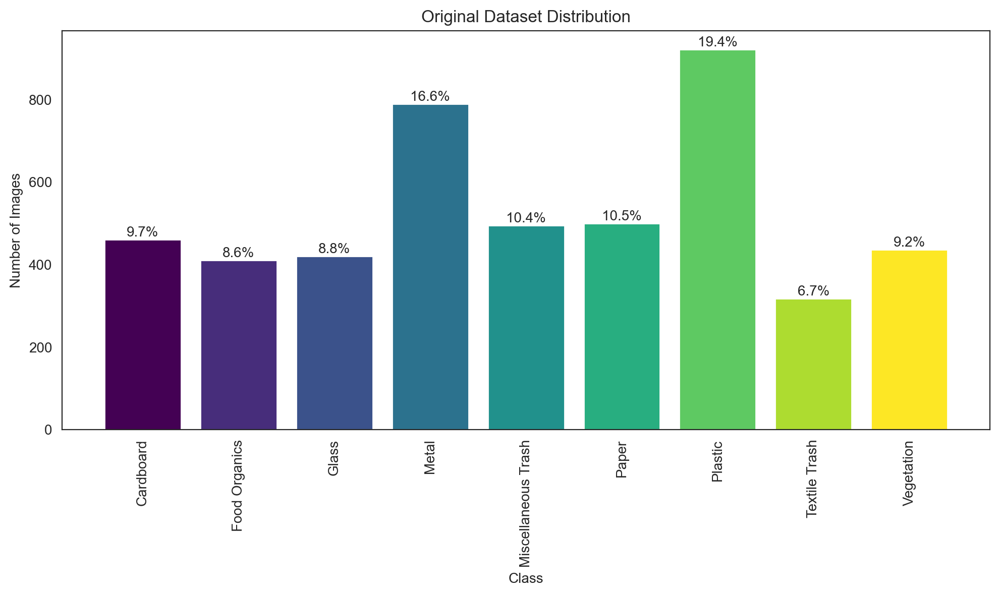

In [15]:
dataset_dir = './RealWaste/' # Directory where the dataset is stored 
fig, ax = plt.subplots(figsize=(10, 6))  
PlotClassesDistribution(ax, dataset_dir, 'Original Dataset Distribution')

plt.tight_layout()
plt.show()

As showed by the barplot above, this dataset has an **imbalanced distribution** of the examples of different classes. Indeed two classes are more common (plastic and metal) and one class is underepresented (textile trash) compared to the others.

To tackle this situation, in this notebook I will force the model to pay more/less attention to the classes based on their frequency, using the parameter ``class_weight``implemented in the function ``.fit`` by Keras, by weighting the loss function.

Other techniques that could be explored to handle imabalanced data are:
* over-sampling
* under-sampling



### 3.2 Example image for each class

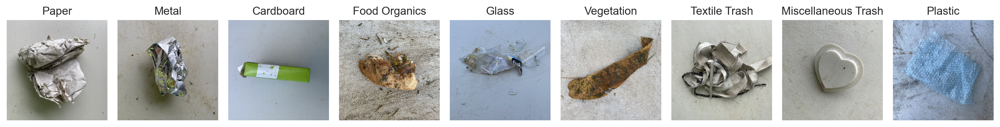

In [16]:
# Create a dict where they key is the type of waste and the value is the path of the first image of that waste class.
first_file = None
class_path_dict = {}
for i in os.listdir(dataset_dir):
    class_path = os.path.join(dataset_dir, i)
    for j in os.listdir(class_path):
        file_path = os.path.join(class_path, j)
        if os.path.isfile(file_path):
            first_file = file_path
            class_path_dict[i] = file_path
            break 


num_images = len(class_path_dict)
fig, axes = plt.subplots(1, num_images, figsize=(15, 5))
if num_images == 1: # if there's only one image, axes won't be an array, so we mke it a list
    axes = [axes]
for ax, (title, img_path) in zip(axes, class_path_dict.items()):
    img = mpimg.imread(img_path)  
    ax.imshow(img)                
    ax.set_title(title)           
    ax.axis('off')                
plt.tight_layout()
plt.show()


## 4. Split the dataset into training, validation and test set

Let's split the dataset in:
- Training set: 80%
- Validation set: 10%
- Test set: 10%

I'll use the *splitfolders* library to split the data while *maintaining the proportion* of each class in each set

In [17]:
import splitfolders

# Split with the ratio 80/10/10
splitfolders.ratio("./RealWaste", output="./working",
    seed=42, ratio=(.8, .1, .1), group_prefix=None, move=False) 

Copying files: 4752 files [00:02, 2323.69 files/s]


In [18]:
# Set the directories of each dataset
train_path = './working/train/'
val_path = './working/val/'
test_path = './working/test/'


Let's plot the distributions of each dataset to ensure that upon splitting the proprotion was mantained.

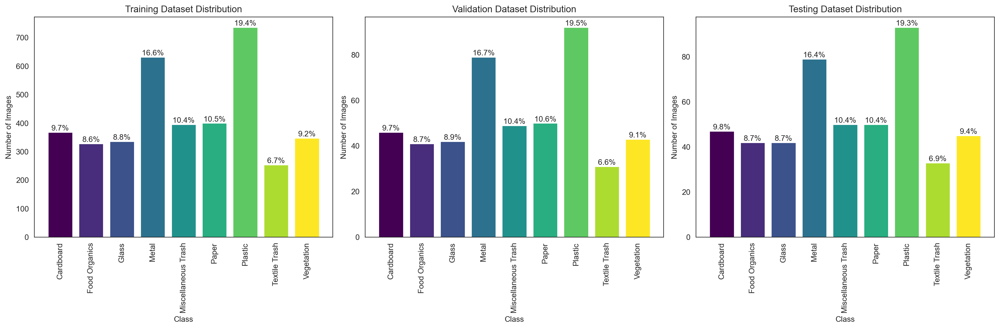

In [19]:
fig, axs = plt.subplots(1, 3, figsize=(18, 6))  

PlotClassesDistribution(axs[0], train_path, 'Training Dataset Distribution')
PlotClassesDistribution(axs[1], val_path, 'Validation Dataset Distribution')
PlotClassesDistribution(axs[2], test_path, 'Testing Dataset Distribution')

plt.tight_layout()
plt.show()

## 5. Load Image Training and Validation dataset

In [20]:
# Resize the images
IMG_WIDTH = 256
IMG_HEIGHT = 256
IMG_SIZE = (IMG_HEIGHT,IMG_WIDTH)
###
BATCH_SIZE = 32
NUM_CLASSES = 9
CHANNELS = 3



In this notebook I will apply **data augmentation**, which is technique used to artificially increase the size of a training dataset by applying various transformations to the existing data. It usually adopted to ensure the **robustness** and **generalization** of the model.

In this specific case I will apply the following transformations: 
* Horizontal flip 
* Rotate 
* Shear

*NB. I applied very light transformations (see the values below), as I've observed that increasing these values tended to worsen the models performance.*

In [21]:
# Training dataset
train_datagen = ImageDataGenerator(rescale=1./255,
                                   horizontal_flip=True,
                                   #vertical_flip = True,
                                   rotation_range = 20,
                                   shear_range = 0.1,
                                   #zoom_range=0.1
)

training= train_datagen.flow_from_directory(
        train_path,
        target_size=(IMG_WIDTH, IMG_HEIGHT),
        color_mode = 'rgb',
        batch_size=BATCH_SIZE,
        class_mode='categorical',
        seed = 42)

# Validation dataset
val_datagen = ImageDataGenerator(rescale=1./255)
validation = val_datagen.flow_from_directory(
        val_path,
        target_size=(IMG_WIDTH, IMG_HEIGHT),
        color_mode = 'rgb',
        batch_size=BATCH_SIZE,
        class_mode='categorical',
        shuffle = False)

Found 3798 images belonging to 9 classes.
Found 473 images belonging to 9 classes.


In [22]:
# Print the class indices and store the mapping in a dictionary
print('Label mapping: ')
label_dict = dict()
for key, value in training.class_indices.items():
    label_dict[key] = value
    print(f'{key}: {value}') 
#
labels = list(label_dict.keys()) # List to store the labels
  


Label mapping: 
Cardboard: 0
Food Organics: 1
Glass: 2
Metal: 3
Miscellaneous Trash: 4
Paper: 5
Plastic: 6
Textile Trash: 7
Vegetation: 8


In [23]:
# Get the one hot encodings label
num_classes = NUM_CLASSES
one_hot_encodings = {} #to store

for class_name, class_index in training.class_indices.items():
    one_hot_vector = np.zeros(num_classes)
    one_hot_vector[class_index] = 1
    one_hot_encodings[class_name] = one_hot_vector

print('One-Hot Encoding mapping: ')
for idx, (label, array) in enumerate(one_hot_encodings.items()):
    print(f'{label}: {array}')

One-Hot Encoding mapping: 
Cardboard: [1. 0. 0. 0. 0. 0. 0. 0. 0.]
Food Organics: [0. 1. 0. 0. 0. 0. 0. 0. 0.]
Glass: [0. 0. 1. 0. 0. 0. 0. 0. 0.]
Metal: [0. 0. 0. 1. 0. 0. 0. 0. 0.]
Miscellaneous Trash: [0. 0. 0. 0. 1. 0. 0. 0. 0.]
Paper: [0. 0. 0. 0. 0. 1. 0. 0. 0.]
Plastic: [0. 0. 0. 0. 0. 0. 1. 0. 0.]
Textile Trash: [0. 0. 0. 0. 0. 0. 0. 1. 0.]
Vegetation: [0. 0. 0. 0. 0. 0. 0. 0. 1.]


Let's plot some examples of **augmented data**

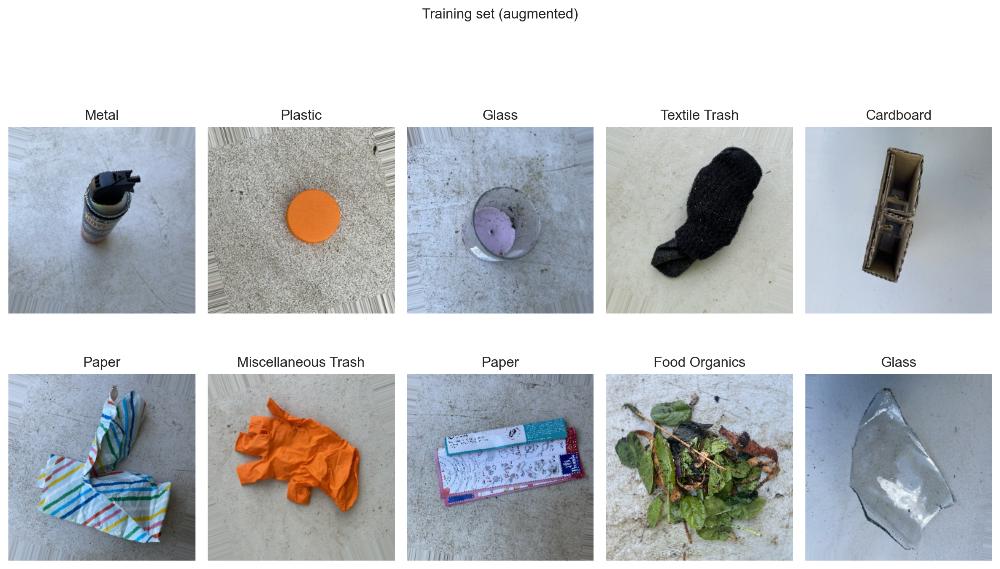

In [24]:
plt.figure(figsize=(12, 8))
plt.suptitle('Training set (augmented)')
for i in range(0, 10):
    plt.subplot(2, 5, i+1)
    for X_batch, Y_batch in training:
        image = X_batch[0]        
        class_dict = one_hot_encodings
        plt.title(GetKeyFromOneHot(one_hot_encodings,Y_batch[0]))
        #plt.title([Y_batch])
        plt.axis('off')
        plt.imshow(image,cmap='grey')
        break
    plt.tight_layout()
#plt.show()

## 6. Callbacks functions and class weights

Two callbacks functions will be adopted:
* **Early Stopping**: It monitors the loss on the validation set during training and stops the training process when the loss on the validation set stops improving. By stopping the training process early, early stopping helps to prevent the model from overfitting to the training data. 

* **Reduce Learning Rate On Plateu**: It reduces the learning rate when a metric has stopped improving after a number of epochs. 



In [25]:
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3)
early_stopping = EarlyStopping(monitor='val_loss', patience=10,restore_best_weights=True)


In [26]:
# to correct the class inbalanceness

class_weights= compute_class_weight(class_weight="balanced", classes=np.array([0,1,2,3,4,5,6,7,8]), y=training.classes)
weights_dict = {i:w for i,w in enumerate(class_weights)}
weights_dict

{0: 1.1467391304347827,
 1: 1.2865853658536586,
 2: 1.255952380952381,
 3: 0.6677215189873418,
 4: 1.0656565656565657,
 5: 1.055,
 6: 0.5733695652173914,
 7: 1.6614173228346456,
 8: 1.2126436781609196}

## 7. Training

First of all I'll initialize a dictionary where we will store the *macro F1-score* of each model, so that at the end we can compare them.
The macro-averaged F1 score (or macro F1-score) is computed by taking the arithmetic mean (unweighted mean) of all the per-class F1 scores. This metrics is suitable to assigned the *same importance to each class* indipendently of its frequency in case of imbalanced dataset (this metrics is agnostic of the frequencies).


In [27]:
macrof1scores_dict = dict()

### 7.1 Base Deep CNN

Let's start with a base model, with three blocks of feature extraction (convolution+pooling+batch-normalizaion) followed by a classifier. 

#### 7.1.1 Model

In [141]:
def cnn_model_1(input_shape, num_classes):
    inputs = Input(shape=(input_shape))

    
    x = Conv2D(64, 3, strides=1, padding="same", name = 'conv_1',activation='relu')(inputs)
    x = MaxPooling2D(pool_size=(2,2),strides=2, padding='same',name='maxpool_1')(x)
    x = BatchNormalization(name='batch_norm_1')(x)
    

    x = Conv2D(128, 3, strides=1, padding="same",name = 'conv_2',activation='relu')(x)
    x = MaxPooling2D(pool_size=(2,2), strides = 2, padding='same',name='maxpool_2')(x)
    x = BatchNormalization(name='batch_norm_2')(x)
    

    x = Conv2D(256, 3, strides=1, padding="same",name = 'conv_3',activation='relu')(x)
    x = MaxPooling2D(pool_size=(2,2), strides = 2, padding='same',name='maxpool_3')(x)
    x = BatchNormalization(name='batch_norm_3')(x)
    

    x = GlobalAveragePooling2D()(x)
    x = Dense(256, activation = 'relu',name='dense_1')(x)
    x = Dropout(0.25)(x)
    x = Dense(64, activation = 'relu',name='dense_2')(x)
    x = Dropout(0.3)(x)
    outputs =Dense(NUM_CLASSES, activation = 'softmax',name='output')(x)

    model = Model(inputs=inputs, outputs=outputs, name='Model-1')
    
    return model
   

cnn1 = cnn_model_1(input_shape=IMG_SIZE + (CHANNELS,), num_classes=NUM_CLASSES)
print(cnn1.summary())



Model: "Model-1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_10 (InputLayer)       [(None, 256, 256, 3)]     0         
                                                                 
 conv_1 (Conv2D)             (None, 256, 256, 64)      1792      
                                                                 
 maxpool_1 (MaxPooling2D)    (None, 128, 128, 64)      0         
                                                                 
 batch_norm_1 (BatchNormaliz  (None, 128, 128, 64)     256       
 ation)                                                          
                                                                 
 conv_2 (Conv2D)             (None, 128, 128, 128)     73856     
                                                                 
 maxpool_2 (MaxPooling2D)    (None, 64, 64, 128)       0         
                                                           

#### 7.1.2 Training

In [29]:
%time
tf.keras.utils.set_random_seed(42)
#
epochs = 100
#
callbacks = [
    reduce_lr,
    early_stopping
]
#
optimizer = Adam(learning_rate=0.001)
#
cnn1.compile(
    optimizer=optimizer,
    loss=CategoricalCrossentropy(),
    weighted_metrics=['accuracy'] # here we put weighted metrics so that sample weighting is applied
)
history1 = cnn1.fit(
    training,
    epochs=epochs,
    callbacks=callbacks,
    validation_data=validation,
    class_weight = weights_dict
)

CPU times: user 1e+03 ns, sys: 1 µs, total: 2 µs
Wall time: 3.1 µs
Epoch 1/100


2024-06-29 13:12:37.558955: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz
2024-06-29 13:12:37.865113: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


119/119 [==============================] - ETA: 0s - loss: 1.7079 - accuracy: 0.3747

2024-06-29 13:13:30.415287: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


119/119 [==============================] - 55s 453ms/step - loss: 1.7079 - accuracy: 0.3747 - val_loss: 2.9796 - val_accuracy: 0.0951 - lr: 0.0010
Epoch 2/100
119/119 [==============================] - 53s 442ms/step - loss: 1.4347 - accuracy: 0.4844 - val_loss: 3.0392 - val_accuracy: 0.0888 - lr: 0.0010
Epoch 3/100
119/119 [==============================] - 53s 445ms/step - loss: 1.3211 - accuracy: 0.5258 - val_loss: 2.1738 - val_accuracy: 0.2452 - lr: 0.0010
Epoch 4/100
119/119 [==============================] - 53s 445ms/step - loss: 1.2607 - accuracy: 0.5497 - val_loss: 1.6451 - val_accuracy: 0.3848 - lr: 0.0010
Epoch 5/100
119/119 [==============================] - 53s 447ms/step - loss: 1.2096 - accuracy: 0.5525 - val_loss: 2.4211 - val_accuracy: 0.2558 - lr: 0.0010
Epoch 6/100
119/119 [==============================] - 53s 446ms/step - loss: 1.1521 - accuracy: 0.5848 - val_loss: 16.4728 - val_accuracy: 0.1057 - lr: 0.0010
Epoch 7/100
119/119 [==============================] - 53

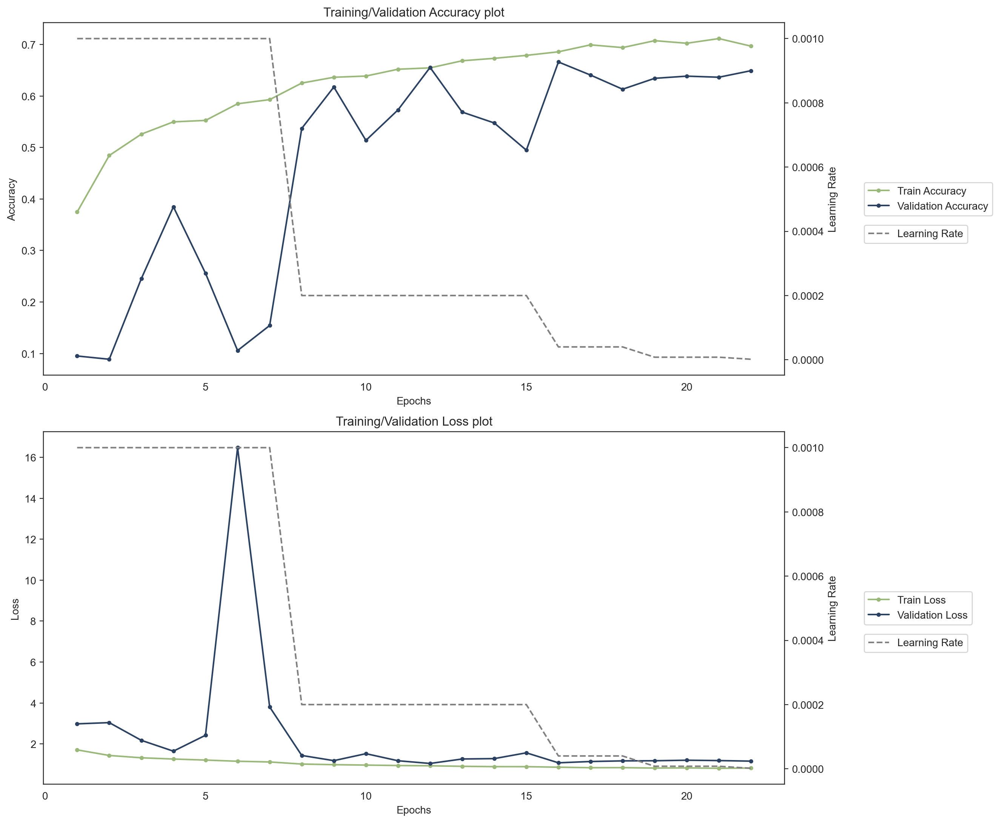

In [30]:
PlotHistory(history=history1)

#### 7.1.3 Evaluation of the performance on the validation set

In [31]:
pred = cnn1.predict(validation)
y_pred = np.argmax(pred, axis=1)
y_true = validation.labels


 1/15 [=>............................] - ETA: 3s

2024-06-29 13:32:09.338616: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


15/15 [==============================] - 2s 125ms/step


Macro F1-Score: 0.6543



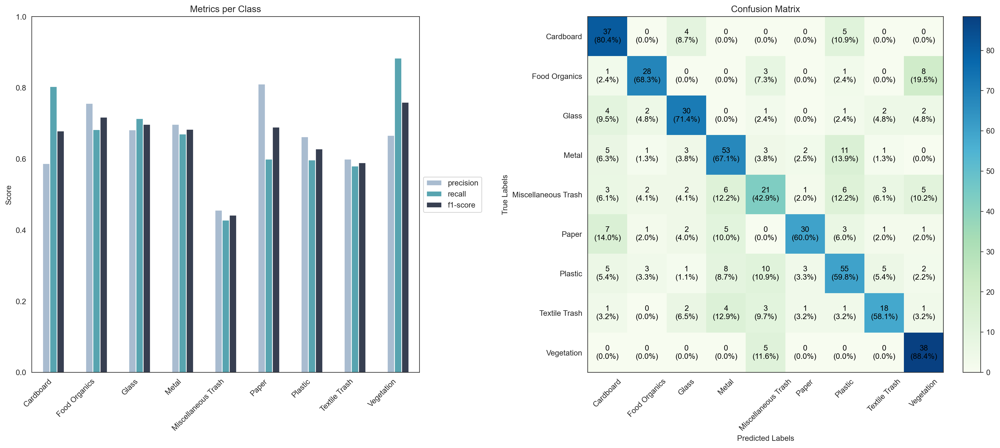

In [32]:
report_Model_1 = classification_report(y_true,y_pred, output_dict=True, target_names=labels)
PlotMetricsAndConfusionMatrix(report_Model_1, labels, y_true, y_pred)
#0.65

In [33]:
#put the macro F1_score in the dict
macrof1scores_dict['Model-1'] = report_Model_1['macro avg']['f1-score']
#
print(PrintMetricsDf(report_Model_1))

╒═════════════════════╤═════════════╤══════════╤════════════╕
│                     │   Precision │   Recall │   F1-score │
╞═════════════════════╪═════════════╪══════════╪════════════╡
│ Cardboard           │    0.587302 │ 0.804348 │   0.678899 │
│ Food Organics       │    0.756757 │ 0.682927 │   0.717949 │
│ Glass               │    0.681818 │ 0.714286 │   0.697674 │
│ Metal               │    0.697368 │ 0.670886 │   0.683871 │
│ Miscellaneous Trash │    0.456522 │ 0.428571 │   0.442105 │
│ Paper               │    0.810811 │ 0.6      │   0.689655 │
│ Plastic             │    0.662651 │ 0.597826 │   0.628571 │
│ Textile Trash       │    0.6      │ 0.580645 │   0.590164 │
│ Vegetation          │    0.666667 │ 0.883721 │   0.76     │
╘═════════════════════╧═════════════╧══════════╧════════════╛
None


Overall this first model does not perform very well (macro f1-score 0.65), particularly we can see that there are differences among the classification of the different classes: it performs better on Vegetatation and Food Organics, while the worst performance is on Textile Trash and Miscellaneous Trash. 
Still we can notice that the model do not suffer of overfitting.

### 7.2 Second Model - Residual Connections and Depthwise Separable Convolutions

With this second model, taking inspiration from chapter 9 of *Deep Learning with Python* by Francois Chollet, I will experiment two features that usually can help building efficient convnets architectures:

* **Residual connections**: they are connections between two layers that are not adjacent, we could define them *information shortcuts*. Indeed, one of the major problem of training a very deep neural network is to deal with vanishing gradients, which occurs because during the training, as the gradients are backpropagated, they become very small and the noise starts overwhelming gradient information. Through residual connections, the model is able to retain a noiseless version of the information contained in the previous input. 

* **Depthwise separable convolutions**: These layers perform a *spatial convolution* on each channel of its input, independently, before mixing output channels via a pointwise convolution. Depthwise separable convolution requires significantly fewer parameters and involves fewer computations compared to regular convolution, while having comparable representational power. It results in smaller models that *converge faster* and are *less prone to overfitting*.


#### 7.2.1 Model

In [143]:


def cnn_model_2(input_shape, num_classes):
    inputs = Input(shape=(input_shape))

    
    x = Conv2D(64, 3, strides=1, padding="same",activation = 'relu')(inputs)
    x = BatchNormalization()(x)
    

    previous_block_activation = x  # Res

    for size in [64,128, 256, 532]:
        x = SeparableConv2D(size, 3, padding="same",use_bias=False,activation = 'relu')(x)
        x = BatchNormalization()(x)

        
        x = SeparableConv2D(size, 3, padding="same",use_bias=False,activation = 'relu')(x)
        x = BatchNormalization()(x)

        x = MaxPooling2D(3, strides=2, padding="same")(x)

        # connect the residual
        residual =Conv2D(size, 1, strides=2, padding="same",activation = 'relu')(
            previous_block_activation
        )
        x = tf.keras.layers.add([x, residual])  # Add new residual
        previous_block_activation = x  

    x = SeparableConv2D(128, 3, padding="same",use_bias=False,activation = 'relu')(x)
    x = BatchNormalization()(x)
    
    

    x = GlobalAveragePooling2D()(x)
    x = Dropout(0.4)(x)
    outputs = Dense(num_classes, activation='softmax')(x)
    return Model(inputs, outputs,name = 'Model-2')

cnn2 = cnn_model_2(input_shape=IMG_SIZE + (3,), num_classes=9)
print(cnn2.summary())


Model: "Model-2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_11 (InputLayer)          [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_99 (Conv2D)             (None, 256, 256, 64  1792        ['input_11[0][0]']               
                                )                                                                 
                                                                                                  
 batch_normalization_104 (Batch  (None, 256, 256, 64  256        ['conv2d_99[0][0]']              
 Normalization)                 )                                                           

#### 7.2.2 Training

*NB. after setting the determinism the training time of this model increased*

In [35]:
%time
tf.keras.utils.set_random_seed(42)
#
epochs = 100
#
callbacks = [
    reduce_lr,
    early_stopping
]
#
optimizer = Adam(learning_rate=0.001)
#
cnn2.compile(
    optimizer=optimizer,
    loss=CategoricalCrossentropy(),
    weighted_metrics=['accuracy'] # here we put weighted metrics so that sample weighting is applied
)
history2 = cnn2.fit(
    training,
    epochs=epochs,
    callbacks=callbacks,
    validation_data=validation,
    class_weight = weights_dict
)
#71m !!

CPU times: user 2 µs, sys: 0 ns, total: 2 µs
Wall time: 3.81 µs
Epoch 1/100


2024-06-29 13:32:13.112537: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


119/119 [==============================] - ETA: 0s - loss: 1.4829 - accuracy: 0.4719

2024-06-29 13:33:58.503683: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


119/119 [==============================] - 110s 904ms/step - loss: 1.4829 - accuracy: 0.4719 - val_loss: 2.2183 - val_accuracy: 0.1670 - lr: 0.0010
Epoch 2/100
119/119 [==============================] - 107s 905ms/step - loss: 1.2339 - accuracy: 0.5626 - val_loss: 2.4318 - val_accuracy: 0.1670 - lr: 0.0010
Epoch 3/100
119/119 [==============================] - 108s 905ms/step - loss: 1.0826 - accuracy: 0.6159 - val_loss: 3.0973 - val_accuracy: 0.0888 - lr: 0.0010
Epoch 4/100
119/119 [==============================] - 107s 896ms/step - loss: 1.0357 - accuracy: 0.6347 - val_loss: 2.8457 - val_accuracy: 0.2051 - lr: 0.0010
Epoch 5/100
119/119 [==============================] - 108s 909ms/step - loss: 0.8432 - accuracy: 0.6995 - val_loss: 1.7209 - val_accuracy: 0.3446 - lr: 2.0000e-04
Epoch 6/100
119/119 [==============================] - 108s 910ms/step - loss: 0.7605 - accuracy: 0.7296 - val_loss: 1.0971 - val_accuracy: 0.6047 - lr: 2.0000e-04
Epoch 7/100
119/119 [=======================

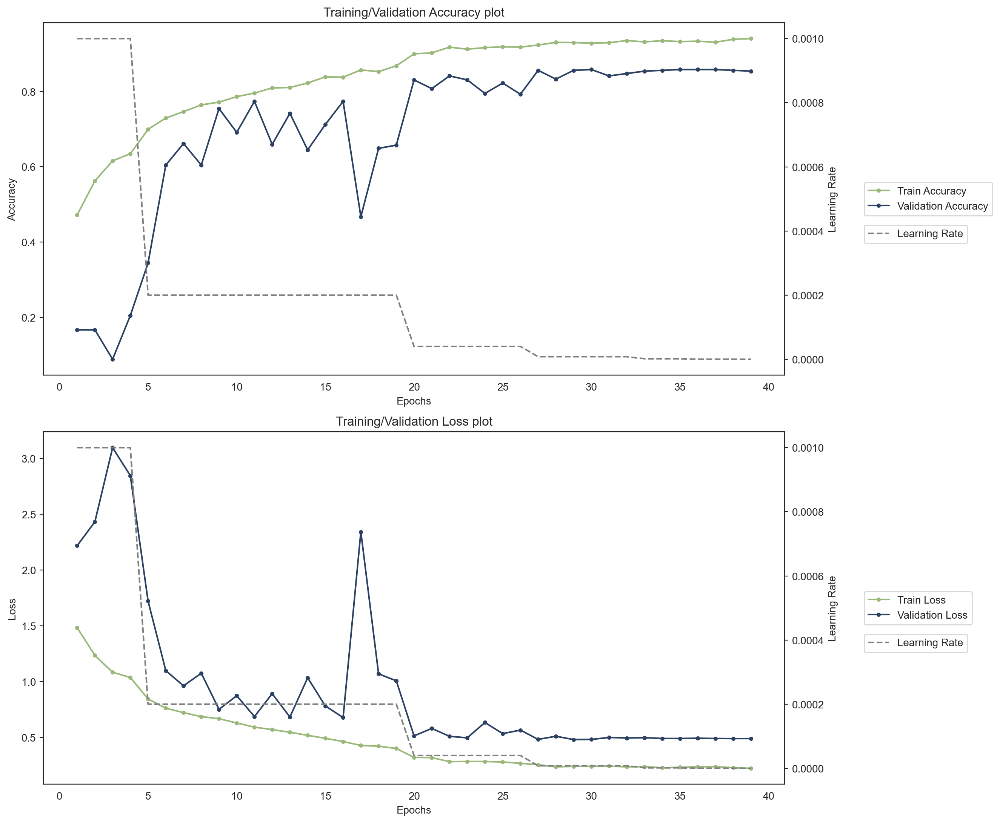

In [36]:
PlotHistory(history=history2)

#### 7.2.3 Evaluation of the performance on the validation set

In [37]:
pred = cnn2.predict(validation)
y_pred = np.argmax(pred,axis=1)
y_true = validation.labels
report_Model_2 = classification_report(y_true,y_pred, output_dict=True, target_names=labels)


2024-06-29 14:43:53.721598: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


15/15 [==============================] - 4s 232ms/step


Macro F1-Score: 0.8497



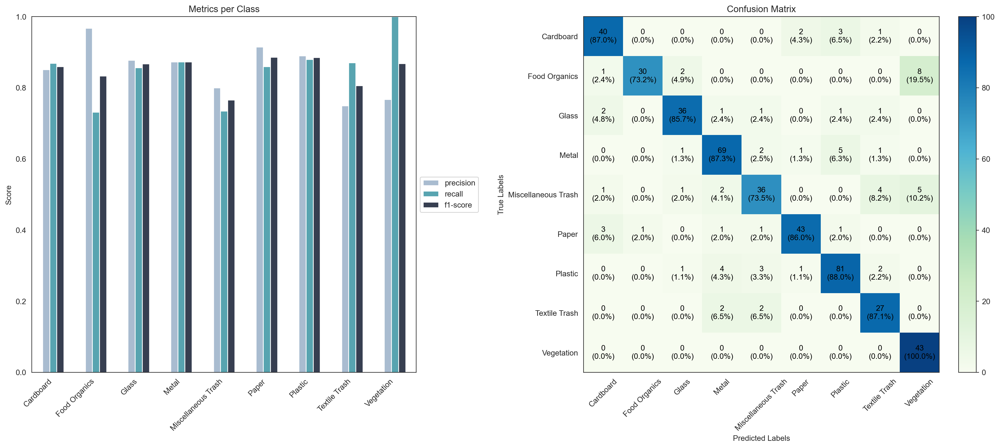

In [38]:
PlotMetricsAndConfusionMatrix(report_Model_2, labels, y_true, y_pred)


In [39]:
#store the macro f1-score
macrof1scores_dict['Model-2'] = report_Model_2['macro avg']['f1-score']

PrintMetricsDf(report_Model_2)

╒═════════════════════╤═════════════╤══════════╤════════════╕
│                     │   Precision │   Recall │   F1-score │
╞═════════════════════╪═════════════╪══════════╪════════════╡
│ Cardboard           │    0.851064 │ 0.869565 │   0.860215 │
│ Food Organics       │    0.967742 │ 0.731707 │   0.833333 │
│ Glass               │    0.878049 │ 0.857143 │   0.86747  │
│ Metal               │    0.873418 │ 0.873418 │   0.873418 │
│ Miscellaneous Trash │    0.8      │ 0.734694 │   0.765957 │
│ Paper               │    0.914894 │ 0.86     │   0.886598 │
│ Plastic             │    0.89011  │ 0.880435 │   0.885246 │
│ Textile Trash       │    0.75     │ 0.870968 │   0.80597  │
│ Vegetation          │    0.767857 │ 1        │   0.868687 │
╘═════════════════════╧═════════════╧══════════╧════════════╛


Compared to the first model, this one achieve an overall better performance. In particular the performance on those classes, which were the worst classified by the first model, are highly improved.


### 7.3. Transfer Learning
Lastly, I will apply the transfer learning technique, which consists in reusing a model which has been already trained on a large dataset (and thus it is a generic model) for our purposes. 

There are two ways of working on pretrained models:

* **Feature extraction**: consists in running the pre-trained network through a specific dataset, the representations learned by this base model are then given input to a classifier, which will be trained from scratch but on top the pre-trained model. 
To do so, it is fundamental to *freeze the convolutional base*, which means to prevent the weights of the layers from being uptade during the training.

* **Fine tuning**: After the model has converged on the data, we can **unfreeze** a part of the layers used for feature extraction and train it with a very **low learning rate**. 
This fine tuning will slighly adjust the model to our classification problem. 
Usually, only a portion of the convolutional base is unfreezed, indeed earlier layers in the convolutional base encode more generic features, while layers higher up encode more specialized features. Thus, it’s more useful to *fine-tune the more specialized features*, because these are the ones that needto be repurposed on your new problem.


For the current task I decided to adopt the two pre-trained models that performed the best in the original paper from which this dataset comes from (https://doi.org/10.3390/info14120633):
- InceptionV3
- DenseNet121


#### 7.3.1 InceptionV3


Inception v3 is an image recognition model that has been shown to attain greater than 78.1% accuracy on the ImageNet dataset. It is based on the original paper: "Rethinking the Inception Architecture for Computer Vision" by Szegedy, et. al.
The model itself is made up of symmetric and asymmetric building blocks, including convolutions, average pooling, max pooling, concatenations, dropouts, and fully connected layers. Batch normalization is used extensively throughout the model and applied to activation inputs. Loss is computed using Softmax.


*(from 'Advanced Guide to Inception v3' - Google Cloud)*

![alt text](InceptionV3.png "Diagram of InceptionV3")

Inception V3 requires a specific kind of input preprocessing, which **scales** input pixels **between -1 and 1**. Therefore, we need to redifine the training and validation dataset:

In [40]:
# Training dataset
train_datagen_inceptionv3 = ImageDataGenerator(preprocessing_function=tf.keras.applications.inception_v3.preprocess_input, # rescaling between -1 and 1
                                   horizontal_flip=True,
                                   #vertical_flip = True,
                                   rotation_range = 20,
                                   shear_range = 0.1,
                                   #zoom_range=0.1
)

#train_datagen = ImageDataGenerator(rescale=1./255)
training_inceptionv3 = train_datagen_inceptionv3.flow_from_directory(
        train_path,
        target_size=(IMG_WIDTH, IMG_HEIGHT),
        color_mode = 'rgb',
        batch_size=BATCH_SIZE,
        class_mode='categorical',
        seed = 42)

# Validation dataset
val_datagen_inceptionv3 = ImageDataGenerator(preprocessing_function=tf.keras.applications.inception_v3.preprocess_input) # rescaling between -1 and 1
validation_inceptionv3 = val_datagen_inceptionv3.flow_from_directory(
        val_path,
        target_size=(IMG_WIDTH, IMG_HEIGHT),
        color_mode = 'rgb',
        batch_size=BATCH_SIZE,
        class_mode='categorical',
        shuffle = False)

Found 3798 images belonging to 9 classes.
Found 473 images belonging to 9 classes.


##### 7.3.1.1 Feature Extraction



In [41]:
InceptionV3_base = InceptionV3(
    weights='imagenet',  # Load weights pre-trained on ImageNet
    input_shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS),
    include_top=False)  # Do not include the ImageNet classifier at the top.
InceptionV3_base.trainable = False # Freeze
InceptionV3_base.summary()

Model: "inception_v3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_5 (Conv2D)              (None, 127, 127, 32  864         ['input_3[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization_10 (BatchN  (None, 127, 127, 32  96         ['conv2d_5[0][0]']               
 ormalization)                  )                                                      

In [144]:
inputs = Input(shape=(IMG_HEIGHT,IMG_WIDTH, CHANNELS))
x = InceptionV3_base(inputs, training=False) # training=False to keep the BatchNormalization layers in inference mode
# Here we add the classifier
x = GlobalAveragePooling2D()(x)
#x = Dense(256,activation='relu')(x)
x = Dropout(0.3, seed=42)(x)
outputs = Dense(NUM_CLASSES, activation="softmax")(x)
cnn3 = Model(inputs, outputs, name='InceptionV3-FE')


cnn3.summary(show_trainable=True)


Model: "InceptionV3-FE"
____________________________________________________________________________
 Layer (type)                Output Shape              Param #   Trainable  
 input_12 (InputLayer)       [(None, 256, 256, 3)]     0         Y          
                                                                            
 inception_v3 (Functional)   (None, 6, 6, 2048)        21802784  Y          
                                                                            
 global_average_pooling2d_9   (None, 2048)             0         Y          
 (GlobalAveragePooling2D)                                                   
                                                                            
 dropout_14 (Dropout)        (None, 2048)              0         Y          
                                                                            
 dense_4 (Dense)             (None, 9)                 18441     Y          
                                                    

In [95]:
%time
tf.keras.utils.set_random_seed(42)
#
epochs = 100
#
callbacks = [
    #reduce_lr,
    early_stopping
]
#
optimizer = Adam(learning_rate=0.001)
#
cnn3.compile(optimizer=optimizer,
    loss=CategoricalCrossentropy(),
    weighted_metrics=['accuracy'] # here we put weighted metrics so that sample weighting is applied
 ) 
history3 = cnn3.fit(
    training_inceptionv3,
    epochs=epochs,
    callbacks=callbacks,
    validation_data=validation_inceptionv3,
    class_weight = weights_dict
)

CPU times: user 1 µs, sys: 5 µs, total: 6 µs
Wall time: 12.2 µs
Epoch 1/100


2024-06-29 18:25:37.543631: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


119/119 [==============================] - ETA: 0s - loss: 0.9667 - accuracy: 0.7180

2024-06-29 18:26:26.487444: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


119/119 [==============================] - 57s 427ms/step - loss: 0.9667 - accuracy: 0.7180 - val_loss: 0.6083 - val_accuracy: 0.7822
Epoch 2/100
119/119 [==============================] - 42s 354ms/step - loss: 0.4015 - accuracy: 0.8564 - val_loss: 0.5884 - val_accuracy: 0.8161
Epoch 3/100
119/119 [==============================] - 42s 354ms/step - loss: 0.3113 - accuracy: 0.8947 - val_loss: 0.6738 - val_accuracy: 0.8076
Epoch 4/100
119/119 [==============================] - 42s 354ms/step - loss: 0.2056 - accuracy: 0.9295 - val_loss: 0.5052 - val_accuracy: 0.8499
Epoch 5/100
119/119 [==============================] - 42s 351ms/step - loss: 0.1751 - accuracy: 0.9386 - val_loss: 0.5364 - val_accuracy: 0.8457
Epoch 6/100
119/119 [==============================] - 42s 354ms/step - loss: 0.1733 - accuracy: 0.9420 - val_loss: 0.5601 - val_accuracy: 0.8393
Epoch 7/100
119/119 [==============================] - 42s 356ms/step - loss: 0.1124 - accuracy: 0.9596 - val_loss: 0.5172 - val_accurac

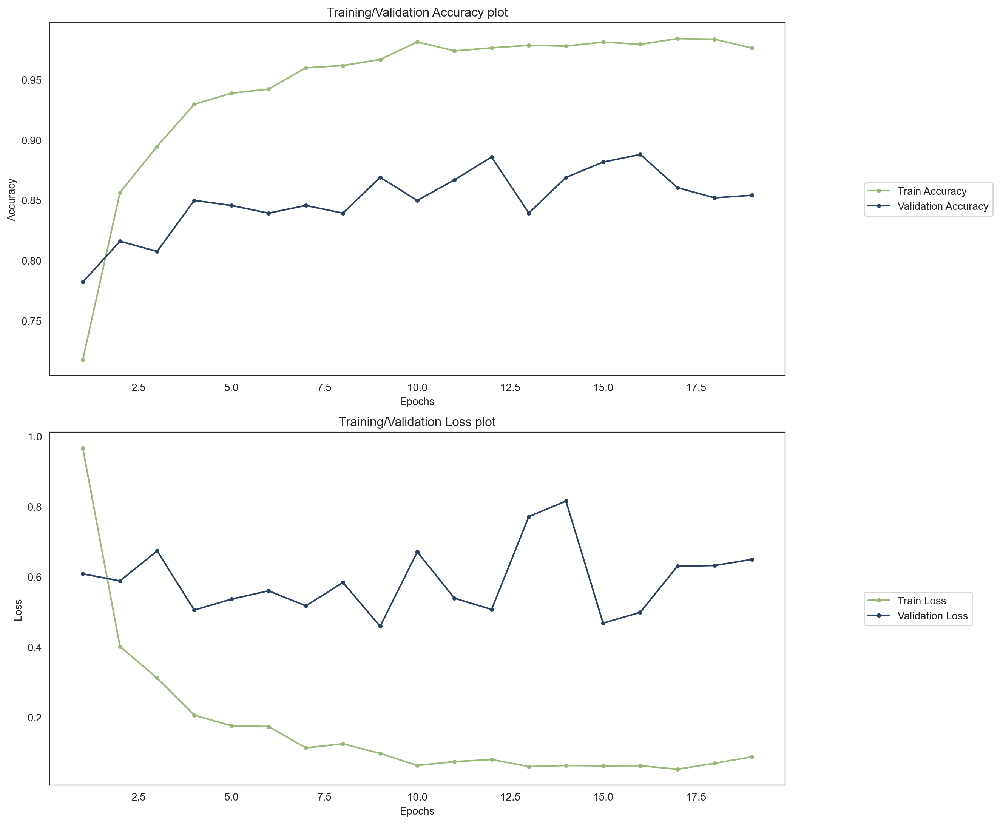

In [102]:
PlotHistory(history=history3)

In [97]:
pred = cnn3.predict(validation)
y_pred = np.argmax(pred,axis=1)
y_true = validation.labels
report_InceptionFE = classification_report(y_true,y_pred, output_dict=True, target_names=labels)



2024-06-29 18:42:05.028308: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


15/15 [==============================] - 6s 235ms/step


Macro F1-Score: 0.8633



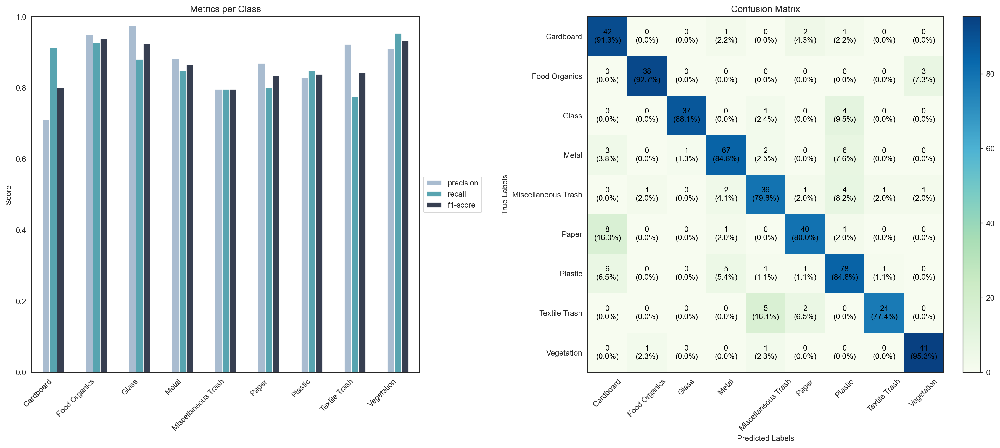

In [98]:
PlotMetricsAndConfusionMatrix(report_InceptionFE,labels,y_true,y_pred)
#0.78

In [99]:
macrof1scores_dict['InceptionV3-FE'] = report_InceptionFE['macro avg']['f1-score']
#
PrintMetricsDf(report_InceptionFE)

╒═════════════════════╤═════════════╤══════════╤════════════╕
│                     │   Precision │   Recall │   F1-score │
╞═════════════════════╪═════════════╪══════════╪════════════╡
│ Cardboard           │    0.711864 │ 0.913043 │   0.8      │
│ Food Organics       │    0.95     │ 0.926829 │   0.938272 │
│ Glass               │    0.973684 │ 0.880952 │   0.925    │
│ Metal               │    0.881579 │ 0.848101 │   0.864516 │
│ Miscellaneous Trash │    0.795918 │ 0.795918 │   0.795918 │
│ Paper               │    0.869565 │ 0.8      │   0.833333 │
│ Plastic             │    0.829787 │ 0.847826 │   0.83871  │
│ Textile Trash       │    0.923077 │ 0.774194 │   0.842105 │
│ Vegetation          │    0.911111 │ 0.953488 │   0.931818 │
╘═════════════════════╧═════════════╧══════════╧════════════╛


##### 7.3.1.2 Fine Tuning



In [100]:
# Unfreeze some layers of the base model
InceptionV3_base.trainable = True
for layer in InceptionV3_base.layers[:279]:
    layer.trainable = False


In [101]:
%time
tf.keras.utils.set_random_seed(42)
# Recompile the model using a low learning rate

epochs = 100
#
callbacks = [
    reduce_lr,
    early_stopping
]
#
optimizer = Adam(learning_rate=1e-6) # low lr
#
cnn3.compile(optimizer=optimizer,
    loss=CategoricalCrossentropy(),
    weighted_metrics=['accuracy'] # here we put weighted metrics so that sample weighting is applied
 ) 
history4 = cnn3.fit(
    training_inceptionv3,
    epochs=epochs,
    callbacks=callbacks,
    validation_data=validation_inceptionv3,
    class_weight = weights_dict
)

CPU times: user 2 µs, sys: 2 µs, total: 4 µs
Wall time: 4.77 µs
Epoch 1/100


2024-06-29 18:42:55.123645: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


119/119 [==============================] - ETA: 0s - loss: 0.0838 - accuracy: 0.9760

2024-06-29 18:43:41.585961: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


119/119 [==============================] - 57s 441ms/step - loss: 0.0838 - accuracy: 0.9760 - val_loss: 0.4524 - val_accuracy: 0.8732 - lr: 1.0000e-06
Epoch 2/100
119/119 [==============================] - 43s 362ms/step - loss: 0.0742 - accuracy: 0.9750 - val_loss: 0.4473 - val_accuracy: 0.8732 - lr: 1.0000e-06
Epoch 3/100
119/119 [==============================] - 43s 360ms/step - loss: 0.0735 - accuracy: 0.9765 - val_loss: 0.4429 - val_accuracy: 0.8753 - lr: 1.0000e-06
Epoch 4/100
119/119 [==============================] - 43s 361ms/step - loss: 0.0643 - accuracy: 0.9737 - val_loss: 0.4393 - val_accuracy: 0.8732 - lr: 1.0000e-06
Epoch 5/100
119/119 [==============================] - 43s 359ms/step - loss: 0.0538 - accuracy: 0.9831 - val_loss: 0.4366 - val_accuracy: 0.8774 - lr: 1.0000e-06
Epoch 6/100
119/119 [==============================] - 42s 349ms/step - loss: 0.0680 - accuracy: 0.9738 - val_loss: 0.4338 - val_accuracy: 0.8795 - lr: 1.0000e-06
Epoch 7/100
119/119 [=============

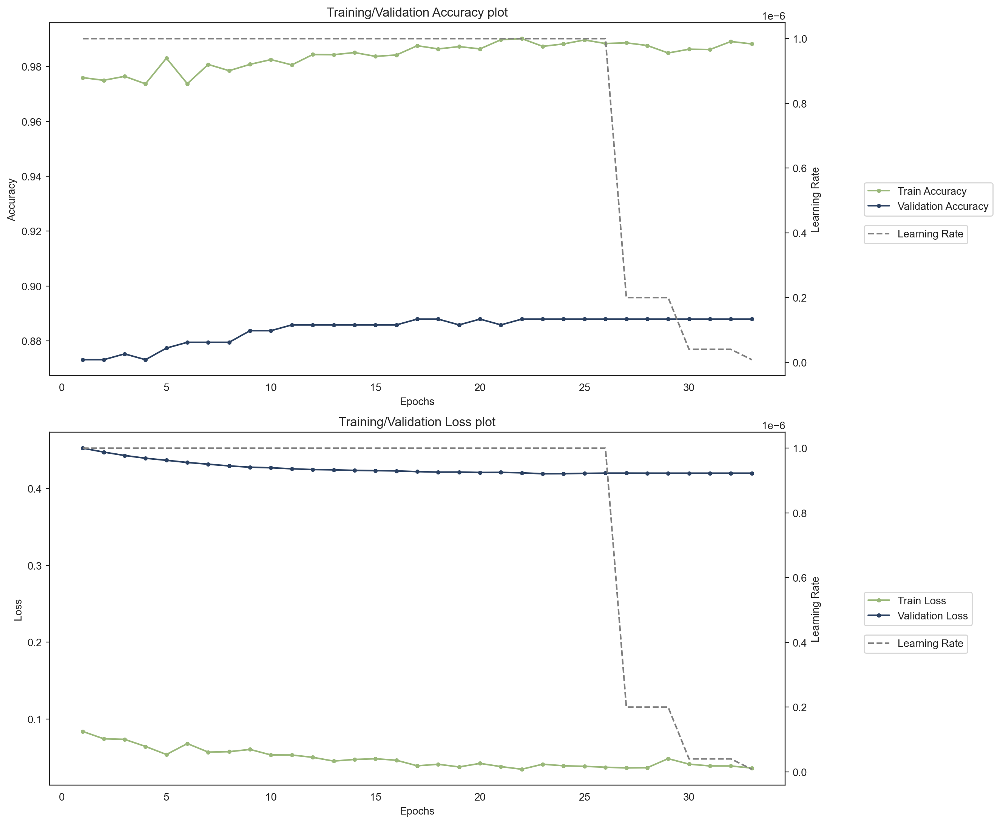

In [103]:
PlotHistory(history=history4)

In [104]:
pred = cnn3.predict(validation)
y_pred = np.argmax(pred,axis=1)
y_true = validation.labels
report_InceptionFT = classification_report(y_true,y_pred, output_dict=True, target_names=labels)

2024-06-29 20:12:42.393022: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


15/15 [==============================] - 7s 282ms/step


Macro F1-Score: 0.8885



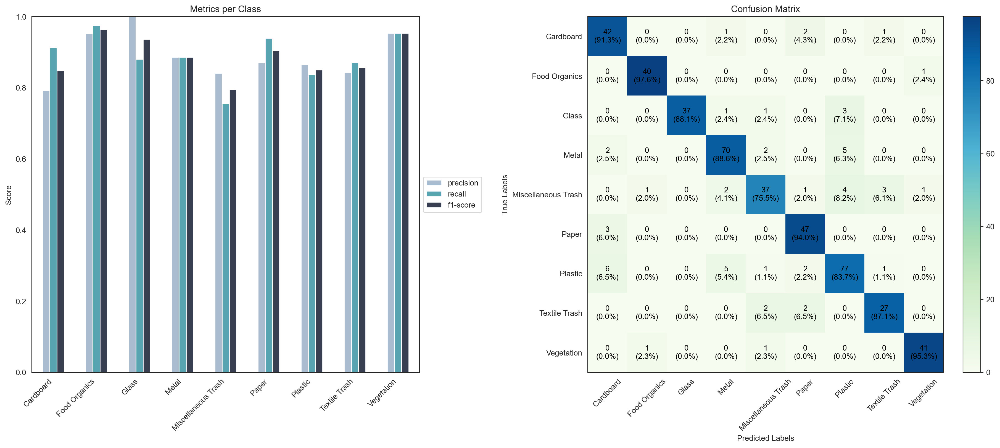

In [105]:
PlotMetricsAndConfusionMatrix(report_InceptionFT,labels,y_true,y_pred)
#0.8051

In [106]:
macrof1scores_dict['InceptionV3-FT'] = report_InceptionFT['macro avg']['f1-score']
#
PrintMetricsDf(report_InceptionFT)

╒═════════════════════╤═════════════╤══════════╤════════════╕
│                     │   Precision │   Recall │   F1-score │
╞═════════════════════╪═════════════╪══════════╪════════════╡
│ Cardboard           │    0.792453 │ 0.913043 │   0.848485 │
│ Food Organics       │    0.952381 │ 0.97561  │   0.963855 │
│ Glass               │    1        │ 0.880952 │   0.936709 │
│ Metal               │    0.886076 │ 0.886076 │   0.886076 │
│ Miscellaneous Trash │    0.840909 │ 0.755102 │   0.795699 │
│ Paper               │    0.87037  │ 0.94     │   0.903846 │
│ Plastic             │    0.865169 │ 0.836957 │   0.850829 │
│ Textile Trash       │    0.84375  │ 0.870968 │   0.857143 │
│ Vegetation          │    0.953488 │ 0.953488 │   0.953488 │
╘═════════════════════╧═════════════╧══════════╧════════════╛


InceptionV3 showed an overall good performance, expecially after the fine-tuning. For some classes it reaches also a f1-score higher than 0.95, and its performance is also good when classifying the most difficult class (Miscellaneous Trash)

#### 7.3.2 DenseNet121

DenseNet stands for “Densely Connected Convolutional Networks,” and it is so named because it connects every layer to every other layer in a feedforward fashion.

![alt text](DenseNet121.jpg "Diagram of a DenseNet")

##### 7.3.2.1 Feature Extraction

In [55]:
DenseNet121_base = DenseNet121(
    weights='imagenet',  # Load weights pre-trained on ImageNet
    input_shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS),
    include_top=False)  # Do not include the ImageNet classifier at the top.
DenseNet121_base.trainable = False # Freeze
DenseNet121_base.summary()

Model: "densenet121"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 zero_padding2d (ZeroPadding2D)  (None, 262, 262, 3)  0          ['input_5[0][0]']                
                                                                                                  
 conv1/conv (Conv2D)            (None, 128, 128, 64  9408        ['zero_padding2d[0][0]']         
                                )                                                                 
                                                                                        

In [145]:
inputs = Input(shape=(IMG_HEIGHT,IMG_WIDTH, CHANNELS))
x = DenseNet121_base(inputs, training=False) # training=False to keep the BatchNormalization layers in inference mode
# Here we add the classifier
x = GlobalAveragePooling2D()(x)
x = Dropout(0.3, seed=42)(x)
outputs = Dense(NUM_CLASSES, activation="softmax")(x)
cnn4 = Model(inputs, outputs, name='DenseNet121-FE')
cnn4.summary(show_trainable=True)


Model: "DenseNet121-FE"
____________________________________________________________________________
 Layer (type)                Output Shape              Param #   Trainable  
 input_13 (InputLayer)       [(None, 256, 256, 3)]     0         Y          
                                                                            
 densenet121 (Functional)    (None, 8, 8, 1024)        7037504   Y          
                                                                            
 global_average_pooling2d_10  (None, 1024)             0         Y          
  (GlobalAveragePooling2D)                                                  
                                                                            
 dropout_15 (Dropout)        (None, 1024)              0         Y          
                                                                            
 dense_5 (Dense)             (None, 9)                 9225      Y          
                                                    

In [108]:
%time
tf.keras.utils.set_random_seed(42)
#
epochs = 100
#
callbacks = [
    #reduce_lr,
    early_stopping
]
#
optimizer = Adam(learning_rate=0.001)
#
cnn4.compile(optimizer=optimizer,
    loss=CategoricalCrossentropy(),
    weighted_metrics=['accuracy'] # here we put weighted metrics so that sample weighting is applied
 ) 
history5 = cnn4.fit(
    training,
    epochs=epochs,
    callbacks=callbacks,
    validation_data=validation,
    class_weight = weights_dict
)

CPU times: user 3 µs, sys: 5 µs, total: 8 µs
Wall time: 14.3 µs
Epoch 1/100


2024-06-29 20:13:52.343206: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


119/119 [==============================] - ETA: 0s - loss: 0.2891 - accuracy: 0.9072

2024-06-29 20:14:57.880162: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


119/119 [==============================] - 81s 599ms/step - loss: 0.2891 - accuracy: 0.9072 - val_loss: 0.4508 - val_accuracy: 0.8647
Epoch 2/100
119/119 [==============================] - 52s 432ms/step - loss: 0.2652 - accuracy: 0.9107 - val_loss: 0.4637 - val_accuracy: 0.8436
Epoch 3/100
119/119 [==============================] - 52s 431ms/step - loss: 0.2038 - accuracy: 0.9286 - val_loss: 0.3834 - val_accuracy: 0.8774
Epoch 4/100
119/119 [==============================] - 51s 428ms/step - loss: 0.2124 - accuracy: 0.9310 - val_loss: 0.4428 - val_accuracy: 0.8520
Epoch 5/100
119/119 [==============================] - 51s 427ms/step - loss: 0.1806 - accuracy: 0.9399 - val_loss: 0.5498 - val_accuracy: 0.8203
Epoch 6/100
119/119 [==============================] - 55s 461ms/step - loss: 0.1402 - accuracy: 0.9491 - val_loss: 0.6863 - val_accuracy: 0.8245
Epoch 7/100
119/119 [==============================] - 52s 434ms/step - loss: 0.1536 - accuracy: 0.9557 - val_loss: 0.5329 - val_accurac

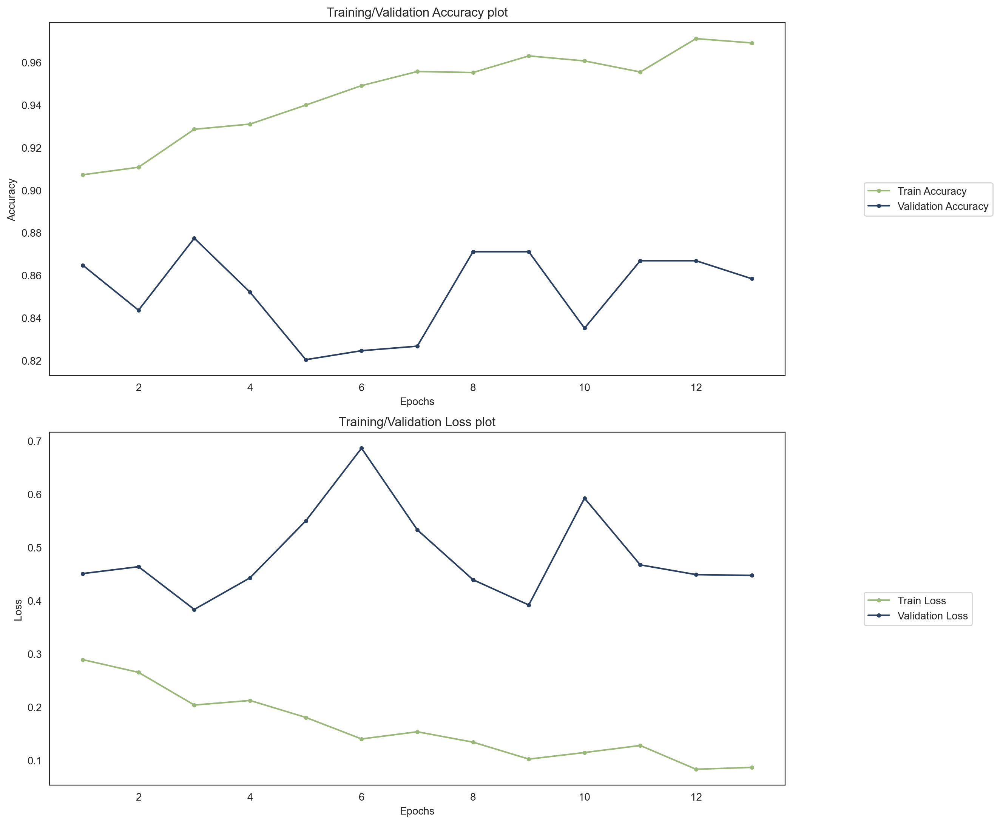

In [109]:
PlotHistory(history5)

In [110]:
pred = cnn4.predict(validation)
y_pred = np.argmax(pred,axis=1)
y_true = validation.labels
report_DenseNet121_FE = classification_report(y_true,y_pred, output_dict=True, target_names=labels)

2024-06-29 20:48:11.373450: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


15/15 [==============================] - 13s 521ms/step


Macro F1-Score: 0.8874



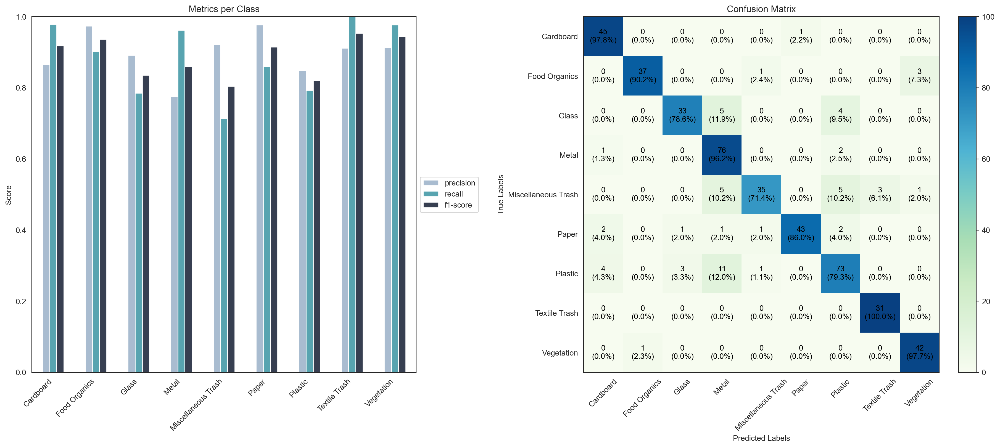

In [111]:
PlotMetricsAndConfusionMatrix(report_DenseNet121_FE,labels,y_true,y_pred)

In [112]:
# store f1-score
macrof1scores_dict['DenseNet121-FE'] = report_DenseNet121_FE['macro avg']['f1-score']
#
PrintMetricsDf(report_DenseNet121_FE)

╒═════════════════════╤═════════════╤══════════╤════════════╕
│                     │   Precision │   Recall │   F1-score │
╞═════════════════════╪═════════════╪══════════╪════════════╡
│ Cardboard           │    0.865385 │ 0.978261 │   0.918367 │
│ Food Organics       │    0.973684 │ 0.902439 │   0.936709 │
│ Glass               │    0.891892 │ 0.785714 │   0.835443 │
│ Metal               │    0.77551  │ 0.962025 │   0.858757 │
│ Miscellaneous Trash │    0.921053 │ 0.714286 │   0.804598 │
│ Paper               │    0.977273 │ 0.86     │   0.914894 │
│ Plastic             │    0.848837 │ 0.793478 │   0.820225 │
│ Textile Trash       │    0.911765 │ 1        │   0.953846 │
│ Vegetation          │    0.913043 │ 0.976744 │   0.94382  │
╘═════════════════════╧═════════════╧══════════╧════════════╛


##### 7.3.2.2 Fine Tuning

In [113]:
layer_num = len(DenseNet121_base.layers)
print(f'Number of layers: {layer_num}')
num_unfreezed_layers = int((layer_num*30)/100)
print(f'Number of unfreezed layers: {num_unfreezed_layers}')

Number of layers: 427
Number of unfreezed layers: 128


In [114]:

# Unfreeze some layers of the base model
DenseNet121_base.trainable = True
for layer in DenseNet121_base.layers[:-int(num_unfreezed_layers)]:
    layer.trainable = False
    

In [115]:
%time
tf.keras.utils.set_random_seed(42)
#
epochs = 100
#
callbacks = [
    reduce_lr,
    early_stopping
]
#
optimizer = Adam(learning_rate=1e-6) # low lr
#
cnn4.compile(optimizer=optimizer,
    loss=CategoricalCrossentropy(),
    weighted_metrics=['accuracy'] # here we put weighted metrics so that sample weighting is applied
 ) 
history6 = cnn4.fit(
    training,
    epochs=epochs,
    callbacks=callbacks,
    validation_data=validation,
    class_weight = weights_dict
)


CPU times: user 1 µs, sys: 1e+03 ns, total: 2 µs
Wall time: 4.05 µs
Epoch 1/100


2024-06-29 20:49:03.063250: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


119/119 [==============================] - ETA: 0s - loss: 0.1265 - accuracy: 0.9631

2024-06-29 20:50:12.701487: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


119/119 [==============================] - 85s 629ms/step - loss: 0.1265 - accuracy: 0.9631 - val_loss: 0.3762 - val_accuracy: 0.8837 - lr: 1.0000e-06
Epoch 2/100
119/119 [==============================] - 52s 430ms/step - loss: 0.1223 - accuracy: 0.9602 - val_loss: 0.3710 - val_accuracy: 0.8774 - lr: 1.0000e-06
Epoch 3/100
119/119 [==============================] - 53s 440ms/step - loss: 0.1075 - accuracy: 0.9656 - val_loss: 0.3660 - val_accuracy: 0.8732 - lr: 1.0000e-06
Epoch 4/100
119/119 [==============================] - 52s 432ms/step - loss: 0.1081 - accuracy: 0.9674 - val_loss: 0.3625 - val_accuracy: 0.8732 - lr: 1.0000e-06
Epoch 5/100
119/119 [==============================] - 52s 432ms/step - loss: 0.1039 - accuracy: 0.9677 - val_loss: 0.3606 - val_accuracy: 0.8753 - lr: 1.0000e-06
Epoch 6/100
119/119 [==============================] - 52s 435ms/step - loss: 0.1015 - accuracy: 0.9677 - val_loss: 0.3586 - val_accuracy: 0.8816 - lr: 1.0000e-06
Epoch 7/100
119/119 [=============

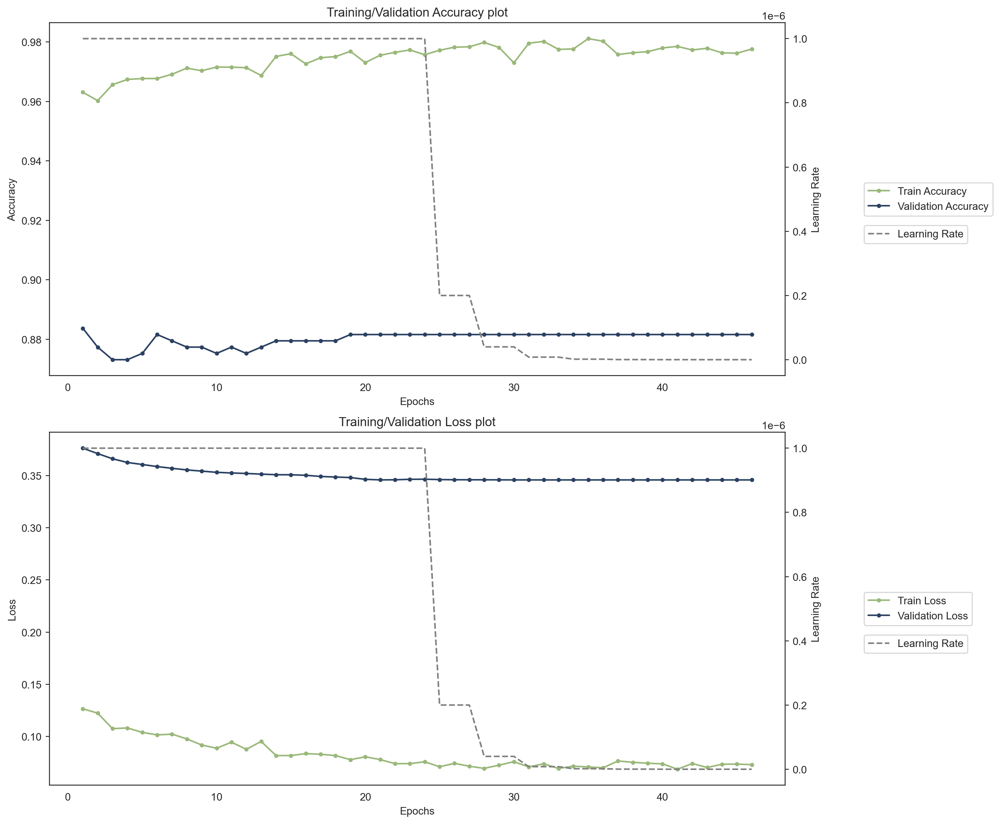

In [116]:
PlotHistory(history6)

In [117]:
pred = cnn4.predict(validation)
y_pred = np.argmax(pred,axis=1)
y_true = validation.labels
report_DenseNet121_FT = classification_report(y_true,y_pred, output_dict=True, target_names=labels)

2024-06-29 21:40:15.153005: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


15/15 [==============================] - 17s 639ms/step


Macro F1-Score: 0.8923



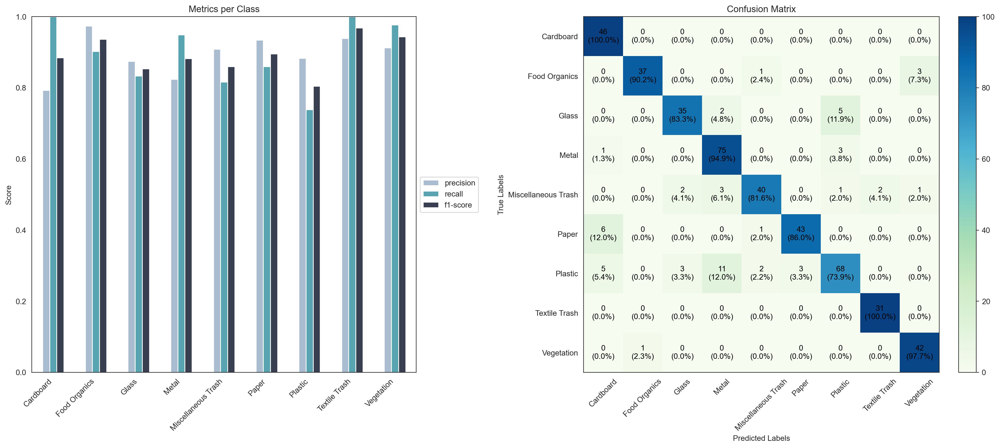

In [118]:
PlotMetricsAndConfusionMatrix(report_DenseNet121_FT,labels,y_true,y_pred)

In [119]:
# store f1-score
macrof1scores_dict['DenseNet121-FT'] = report_DenseNet121_FT['macro avg']['f1-score']
#
PrintMetricsDf(report_DenseNet121_FT)

╒═════════════════════╤═════════════╤══════════╤════════════╕
│                     │   Precision │   Recall │   F1-score │
╞═════════════════════╪═════════════╪══════════╪════════════╡
│ Cardboard           │    0.793103 │ 1        │   0.884615 │
│ Food Organics       │    0.973684 │ 0.902439 │   0.936709 │
│ Glass               │    0.875    │ 0.833333 │   0.853659 │
│ Metal               │    0.824176 │ 0.949367 │   0.882353 │
│ Miscellaneous Trash │    0.909091 │ 0.816327 │   0.860215 │
│ Paper               │    0.934783 │ 0.86     │   0.895833 │
│ Plastic             │    0.883117 │ 0.73913  │   0.804734 │
│ Textile Trash       │    0.939394 │ 1        │   0.96875  │
│ Vegetation          │    0.913043 │ 0.976744 │   0.94382  │
╘═════════════════════╧═════════════╧══════════╧════════════╛


DenseNet121 showed to be a good model for this task, demonstrating strong performance across all classes, including those that were the most challenging for the other models tested in this notebook.

## 8. Compare the performances of the different models on the validation set

 

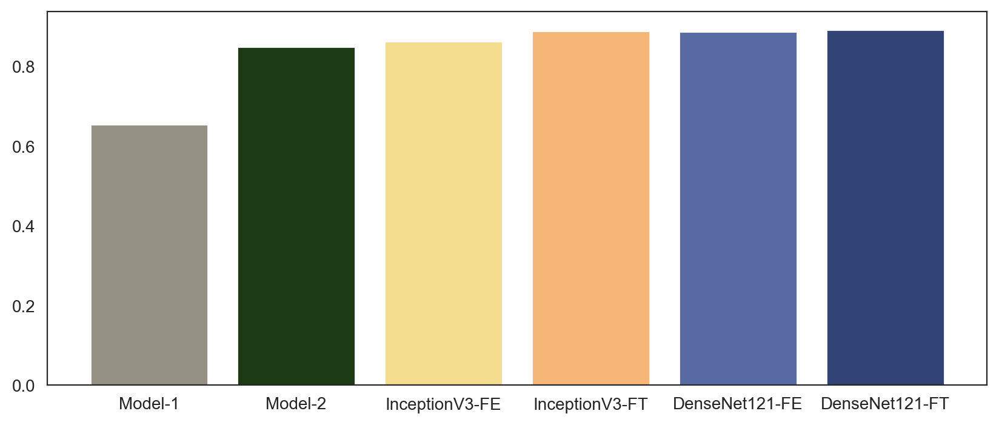

The best model is: DenseNet121-FT


In [127]:
# barplot of macro f1-scores
colors = ['#949083','#1C3A13', '#F5DD90', '#F6B678','#586BA4','#324376']
fig, ax = plt.subplots(figsize=(10, 4))  
plt.bar(macrof1scores_dict.keys(), macrof1scores_dict.values(), color=colors)
plt.show()
best_model = max(macrof1scores_dict, key=macrof1scores_dict.get)
print(f'The best model is: {best_model}')


DenseNet121-FT is the model that overall had a better performance, thus it will be the one use in the testing part.

## 9. Testing on the best model
### 9.1 Testing

In [128]:
test_datagen = ImageDataGenerator(rescale= 1.0 / 255)
test = test_datagen.flow_from_directory(directory= test_path, 
                                         target_size=(IMG_WIDTH,IMG_HEIGHT), 
                                         color_mode = 'rgb',
                                         batch_size = BATCH_SIZE, 
                                         class_mode='categorical',
                                         shuffle= False)

Found 481 images belonging to 9 classes.


In [129]:
# prediction
tf.keras.utils.set_random_seed(42)
result = cnn4.predict(test,verbose = 0)

y_pred = np.argmax(result, axis = 1)
y_true = test.labels
###


2024-06-29 21:49:02.597395: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Macro F1-Score: 0.8593



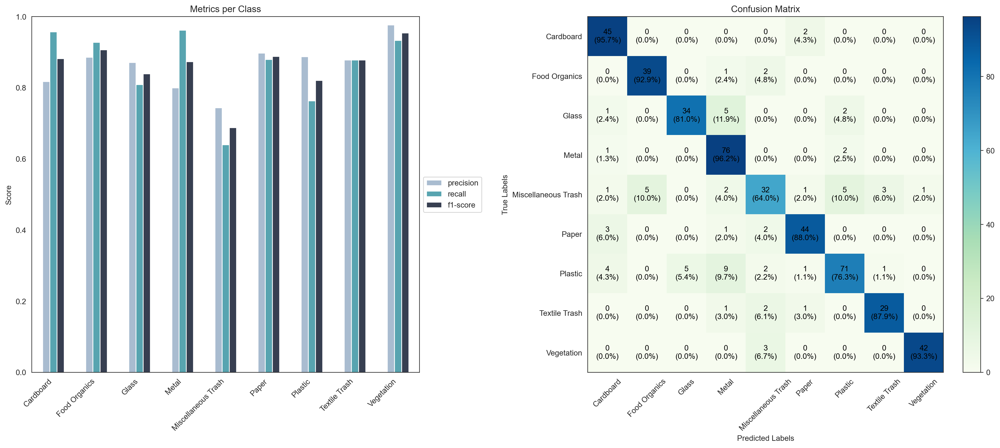

In [130]:
final_report = classification_report(y_true,y_pred, output_dict=True, target_names=labels)
PlotMetricsAndConfusionMatrix(final_report, labels,y_true,y_pred)

In [131]:
PrintMetricsDf(final_report)

╒═════════════════════╤═════════════╤══════════╤════════════╕
│                     │   Precision │   Recall │   F1-score │
╞═════════════════════╪═════════════╪══════════╪════════════╡
│ Cardboard           │    0.818182 │ 0.957447 │   0.882353 │
│ Food Organics       │    0.886364 │ 0.928571 │   0.906977 │
│ Glass               │    0.871795 │ 0.809524 │   0.839506 │
│ Metal               │    0.8      │ 0.962025 │   0.873563 │
│ Miscellaneous Trash │    0.744186 │ 0.64     │   0.688172 │
│ Paper               │    0.897959 │ 0.88     │   0.888889 │
│ Plastic             │    0.8875   │ 0.763441 │   0.820809 │
│ Textile Trash       │    0.878788 │ 0.878788 │   0.878788 │
│ Vegetation          │    0.976744 │ 0.933333 │   0.954545 │
╘═════════════════════╧═════════════╧══════════╧════════════╛


## 9.2 Wrong Predictions

Let's see which are some of the misclassified images:

In [132]:
errors = (y_true - y_pred != 0)
y_true_errors = y_true[errors]
y_pred_errors = y_pred[errors]


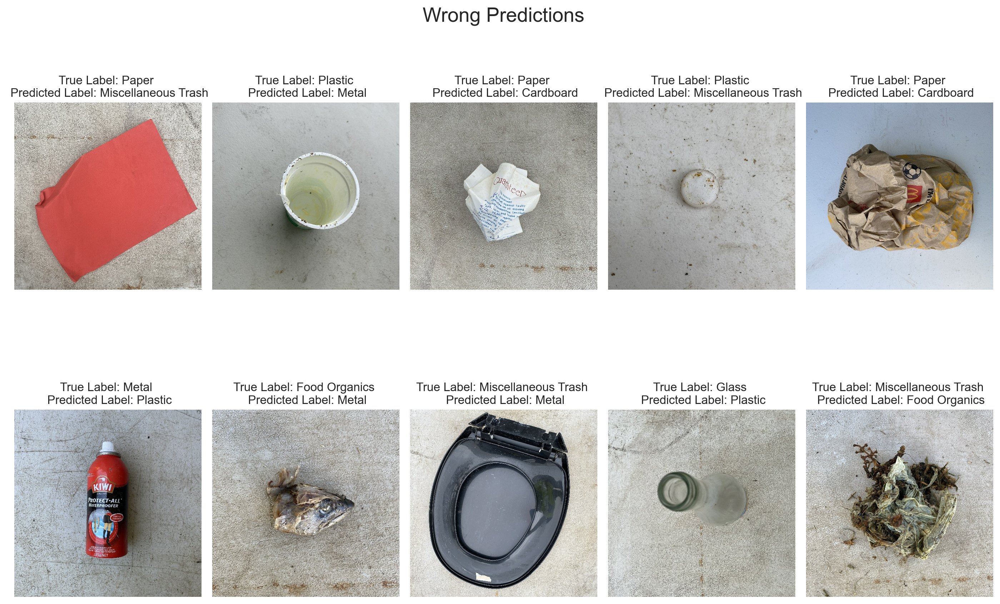

In [134]:

test_images = test.filenames
test_img = np.asarray(test_images)[errors]

fig, ax = plt.subplots(nrows=2, ncols=5, figsize=(14, 10))
idx = 0

for i in range(2):
    for j in range(5):
        idx = np.random.randint(0, len(test_img))
        true_index = y_true_errors[idx]
        true_label = labels[true_index]
        predicted_index = y_pred_errors[idx]
        predicted_label = labels[predicted_index]
        ax[i, j].set_title(f"True Label: {true_label} \n Predicted Label: {predicted_label}")
        img_path = os.path.join(test_path, test_img[idx])
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        ax[i, j].imshow(img)
        ax[i, j].axis("off")

plt.tight_layout()
plt.suptitle('Wrong Predictions', fontsize=20)
plt.show()


**Comments on the misclassification errors:**

- I've noticed that items that are blackish/greyish tend to me mislabeled for metal
- Some miscellaneous trash items that have a greenish color are often mislabeled as Food Organic
- Metal, plastic and carboard are often confused with each other, probably because they share certain shapes and also the presence of graphical elements


-------
**FINAL COMMENTS** 

In this notebook I've explored different models to classify the RealWaste dataset, which is composed by an heterogeneous groups of items.
 Among the different approaches, I experimented with pre-trained models and found that DenseNet121 performed the best. Interestingly, in the original paper where this dataset was introduced, InceptionV3 was the top-performing model.

For DenseNet121, the classes with the highest accuracy were Vegetation and Food Organic, whereas Miscellaneous Trash had the lowest performance, as expected. This is due to the Miscellaneous Trash category being characterized by items with varying textures, shapes, and colors.

Here are some potential improvements for this project:

- Use input data with *higher resolution*.
- Address the class imbalance issue with *over-sampling and under-sampling* techniques.
- Implement *cross-validation* for more robust performance assessment.
- Conduct *hyperparameter optimization* to identify the best architecture.
- Experiment with *other pre-trained models* (e.g., EfficientNet).

